<a href="https://colab.research.google.com/github/DHjeelm/OpenProjectAboutGANs/blob/main/Fashion_GAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Notebook inspired by: https://github.com/jglombitza/tutorial_generative_models

In [6]:
# Import needed packages
import numpy as np
import tensorflow as tf
from tensorflow import keras
import matplotlib.pyplot as plt
layers = keras.layers
import matplotlib.pyplot as plt


In [7]:
# Download dataset and normalize it ([0,1])
fashion_mnist = keras.datasets.fashion_mnist

(train_images, train_labels), _ = fashion_mnist.load_data()
train_images = train_images[...,np.newaxis] / 255

4431872/4422102 [==============================] - 0s 0us/step


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if sys.path[0] == '':


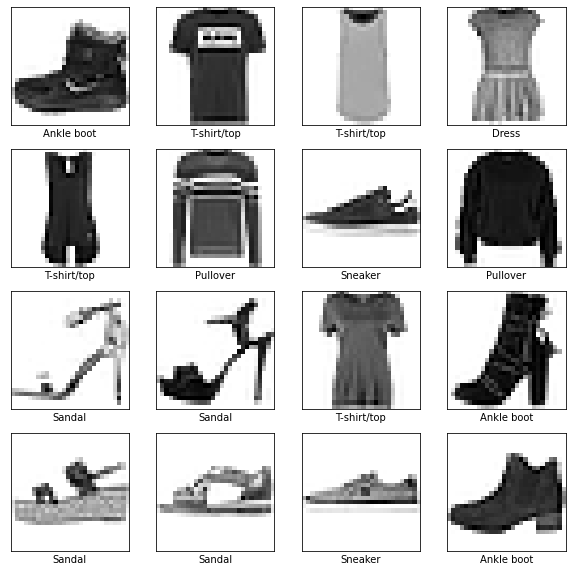

In [8]:
# Inpsect the data 
class_names = ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat',
               'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']

plt.figure(figsize=(10,10))

for i in range(16):
    plt.subplot(4,4,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow((255 * train_images[i]).astype(np.int).squeeze(), cmap=plt.cm.binary)
    plt.xlabel(class_names[train_labels[i]])

plt.show()

In [9]:
# Create a Generator model
def generator_model(latent_size):
    """ Generator network """
    latent = layers.Input(shape=(latent_size,), name="noise")
    z = layers.Dense(7 * 7 * latent_size)(latent)
    z = layers.BatchNormalization()(z)
    z = layers.Activation('relu')(z)
    z = layers.Reshape([7, 7, latent_size])(z)
    z = layers.UpSampling2D(size=(2, 2))(z)
    z = layers.Conv2D(128, (5, 5), padding='same')(z)
    z = layers.BatchNormalization()(z)
    z = layers.Activation('relu')(z)
    z = layers.UpSampling2D(size=(2, 2))(z)
    z = layers.Conv2D(64, (5, 5), padding='same')(z)
    z = layers.BatchNormalization()(z)
    z = layers.Activation('relu')(z)
    z = layers.Conv2D(1, (5, 5), padding='same')(z)
    z = layers.Activation('sigmoid')(z)
    # We need a sigmoid activation as we normalized the data to [0,1]
    return keras.models.Model(latent, z, name="generator")

Model: "generator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 noise (InputLayer)          [(None, 100)]             0         
                                                                 
 dense_1 (Dense)             (None, 4900)              494900    
                                                                 
 batch_normalization_3 (Batc  (None, 4900)             19600     
 hNormalization)                                                 
                                                                 
 activation_4 (Activation)   (None, 4900)              0         
                                                                 
 reshape_1 (Reshape)         (None, 7, 7, 100)         0         
                                                                 
 up_sampling2d_2 (UpSampling  (None, 14, 14, 100)      0         
 2D)                                                     

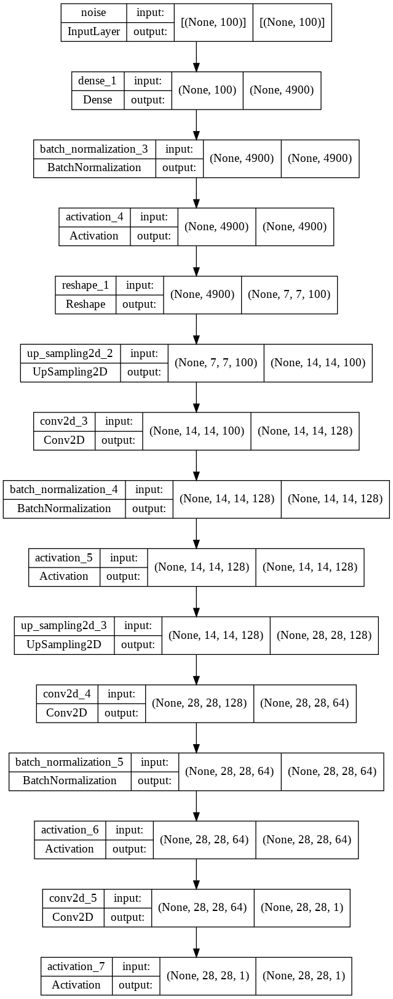

In [12]:
# Build the generator and check if it looks alright
latent_size = 100
g = generator_model(latent_size)
g.summary()
keras.utils.plot_model(g, show_shapes=True)


In [13]:
# Create a Discriminator model
def discriminator_model(drop_rate=0.25):
    """ Discriminator network """
    image = layers.Input(shape=(28,28,1), name="images")
    x = layers.Conv2D(32, (5, 5), padding='same', strides=(2, 2))(image)
    x = layers.LeakyReLU(0.2)(x)
    x = layers.Conv2D(64, (5, 5), padding='same', strides=(2, 2))(x)
    x = layers.LeakyReLU(0.2)(x)
    x = layers.Conv2D(128, (5, 5), padding='same', strides=(2, 2))(x)
    x = layers.LeakyReLU(0.2)(x)
    x = layers.Flatten()(x)
    x = layers.Dropout(drop_rate)(x)
    x = layers.Dense(256)(x)
    x = layers.LeakyReLU(0.2)(x)
    x = layers.Dropout(drop_rate)(x)
    x = layers.Dense(2)(x)
    x = layers.Activation("softmax")(x)
    return keras.models.Model(image, x, name="discriminator")

Model: "discriminator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 images (InputLayer)         [(None, 28, 28, 1)]       0         
                                                                 
 conv2d_6 (Conv2D)           (None, 14, 14, 32)        832       
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 14, 14, 32)        0         
                                                                 
 conv2d_7 (Conv2D)           (None, 7, 7, 64)          51264     
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 7, 7, 64)          0         
                                                                 
 conv2d_8 (Conv2D)           (None, 4, 4, 128)         204928    
                                                                 
 leaky_re_lu_2 (LeakyReLU)   (None, 4, 4, 128)       

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


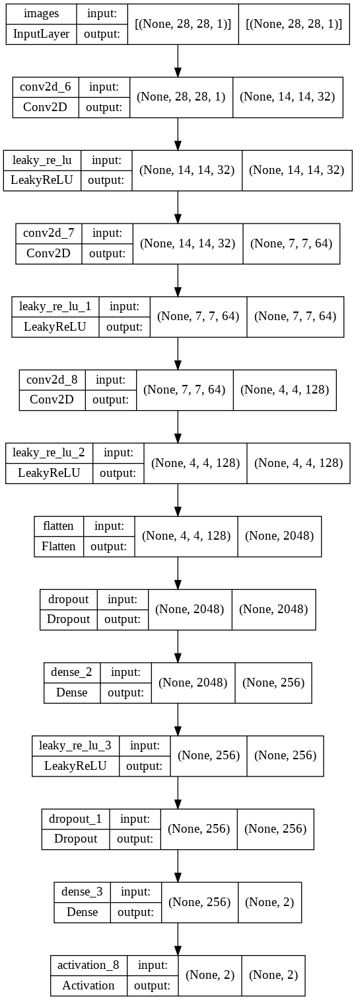

In [14]:
# Build the discriminator, compile and check if it looks alright
d = discriminator_model()
d.summary()
d_opt = keras.optimizers.Adam(lr=2e-4, beta_1=0.5, decay=0.0005)
d.compile(loss='binary_crossentropy', optimizer=d_opt, metrics=["acc"])
keras.utils.plot_model(d, show_shapes=True)

In [15]:
# Function that is used to make sure the generator and discriminator is trained at the right moment (freeze/unfreeze)
def make_trainable(model, trainable):
    ''' Freezes/unfreezes the weights in the given model '''
    for layer in model.layers:
        # print(type(layer))
        if type(layer) is layers.BatchNormalization:
            layer.trainable = True
        else:
            layer.trainable = trainable

In [16]:
# Freeze the critic during the generator training
make_trainable(d, False)
# Unfreeze the generator during the generator training
make_trainable(g, True)  

In [20]:
# We build the pipeline for the generator training by stacking the generator on the discriminator (with frozen weights).
gen_input = g.inputs
generator_training = keras.models.Model(gen_input, d(g(gen_input)))
generator_training.summary()
keras.utils.plot_model(generator_training, show_shapes=True)
g_opt = keras.optimizers.Adam(lr=2e-4, beta_1=0.5, decay=0.0005)
generator_training.compile(loss='binary_crossentropy', optimizer=g_opt)

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 noise (InputLayer)          [(None, 100)]             0         
                                                                 
 generator (Functional)      (None, 28, 28, 1)         1041861   
                                                                 
 discriminator (Functional)  (None, 2)                 782082    
                                                                 
Total params: 1,823,943
Trainable params: 1,031,677
Non-trainable params: 792,266
_________________________________________________________________


/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


In [21]:
# Pre-train the discriminator using 5000 real and 5000 fakes samples (pure noise, since the generator wasn't updated yet).
ntrain = 5000
no = np.random.choice(len(train_images), size=ntrain, replace='False')
real_train = train_images[no,:,:,:]   # sample real images from training set
noise_gen = np.random.uniform(0,1,size=[ntrain, latent_size])
generated_images = g.predict(noise_gen)  # generate fake images with untrained generator

X = np.concatenate((real_train, generated_images))
y = np.zeros([2*ntrain, 2])   # class vector: one-hot encoding
y[:ntrain, 1] = 1             # class 1 for real images
y[ntrain:, 0] = 1             # class 0 for generated images

# - Train the discriminator for 1 epoch on this dataset.
d.fit(X,y, epochs=1, batch_size=64)

157/157 [==============================] - 2s 10ms/step - loss: 6.8370e-04 - acc: 1.0000


Epoch:  0/20
iteration 1
generator loss 6.881763935089111
discriminator loss 0.00012226465332787484


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:60: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations


iteration 501
generator loss 0.0012702292297035456
discriminator loss 0.08558287471532822
Epoch:  1/20
iteration 1001
generator loss 1.0666028261184692
discriminator loss 0.5864817500114441
iteration 1501
generator loss 0.897095263004303
discriminator loss 0.23475539684295654
Epoch:  2/20
iteration 2001
generator loss 1.4080712795257568
discriminator loss 0.30780431628227234
iteration 2501
generator loss 0.6878963708877563
discriminator loss 0.2223076969385147
Epoch:  3/20
iteration 3001
generator loss 0.26690858602523804
discriminator loss 0.35491877794265747
iteration 3501
generator loss 0.47760194540023804
discriminator loss 0.3661655783653259
Epoch:  4/20
iteration 4001
generator loss 1.2178608179092407
discriminator loss 0.44577810168266296
iteration 4501
generator loss 1.5429530143737793
discriminator loss 0.28854629397392273
Epoch:  5/20
iteration 5001
generator loss 0.37425506114959717
discriminator loss 0.2976177930831909
iteration 5501
generator loss 0.5214525461196899
discri

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:53: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Epoch: 11/20
iteration 10501
generator loss 0.31890401244163513
discriminator loss 0.1001989096403122
iteration 11001
generator loss 2.3043711185455322
discriminator loss 0.07242792844772339
Epoch: 12/20
iteration 11501
generator loss 1.9731996059417725
discriminator loss 0.3011047840118408
iteration 12001
generator loss 1.0510807037353516
discriminator loss 0.5062887072563171
Epoch: 13/20
iteration 12501
generator loss 1.7921063899993896
discriminator loss 0.2508211135864258
iteration 13001
generator loss 1.7642804384231567
discriminator loss 0.3172608017921448
Epoch: 14/20
iteration 13501
generator loss 1.6529911756515503
discriminator loss 0.3998146057128906
iteration 14001
generator loss 0.7220762372016907
discriminator loss 0.1705802083015442
Epoch: 15/20
iteration 14501
generator loss 0.7822778224945068
discriminator loss 0.35335102677345276
Epoch: 16/20
iteration 15001
generator loss 1.5938769578933716
discriminator loss 0.311818391084671
iteration 15501
generator loss 0.3047863

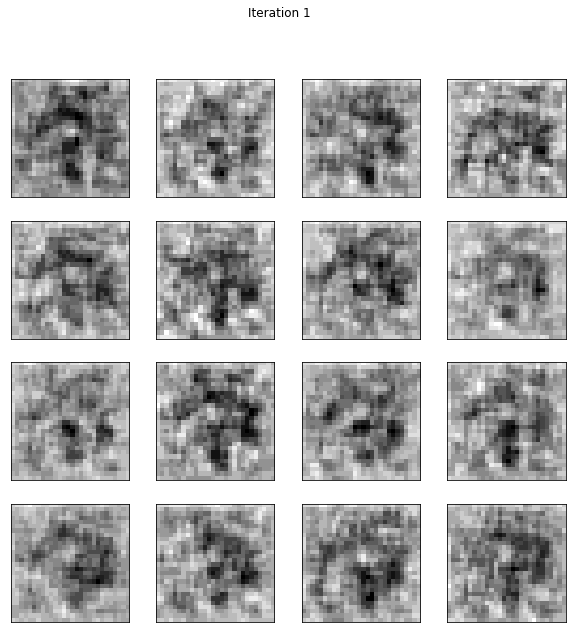

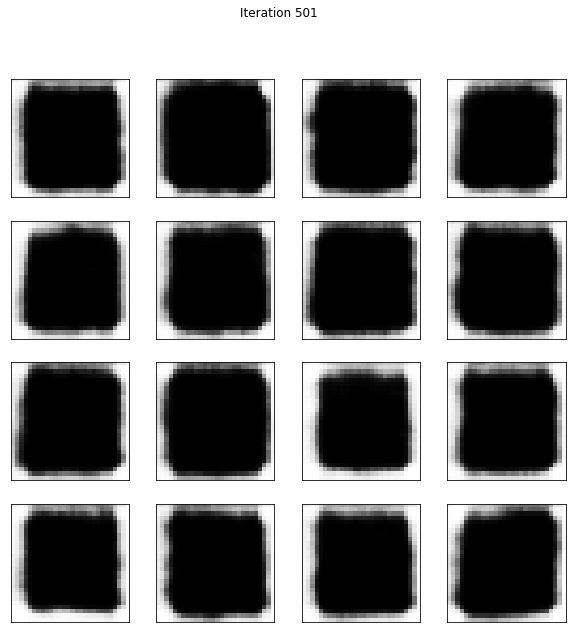

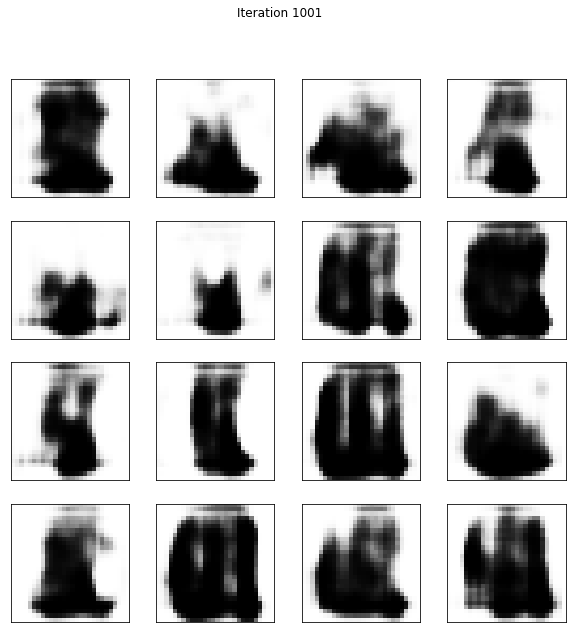

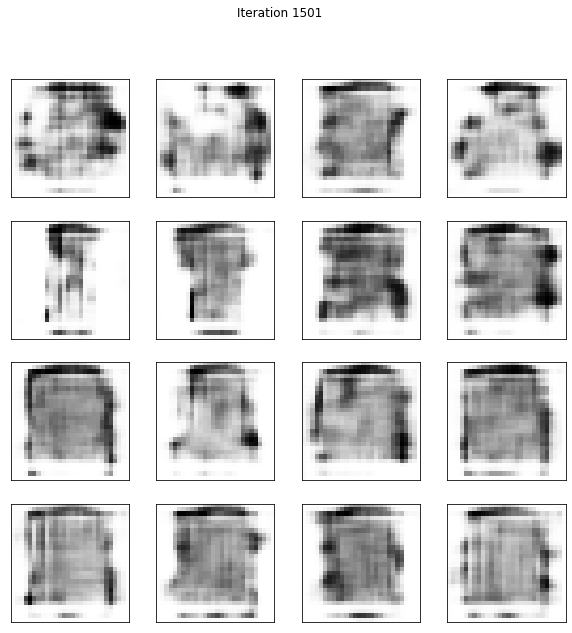

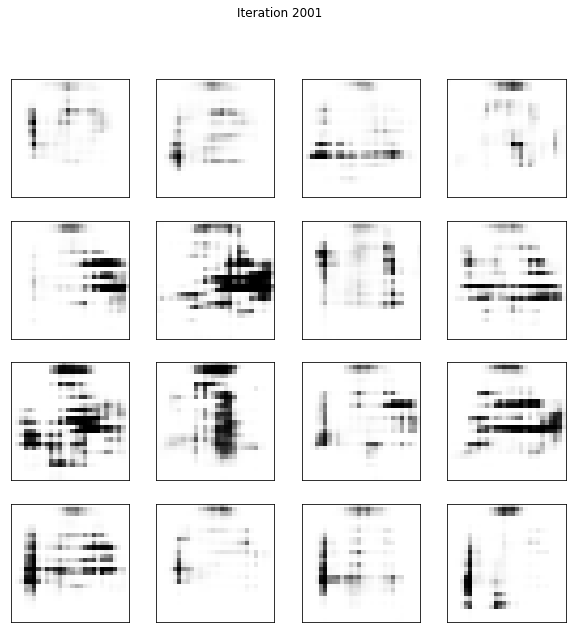

...

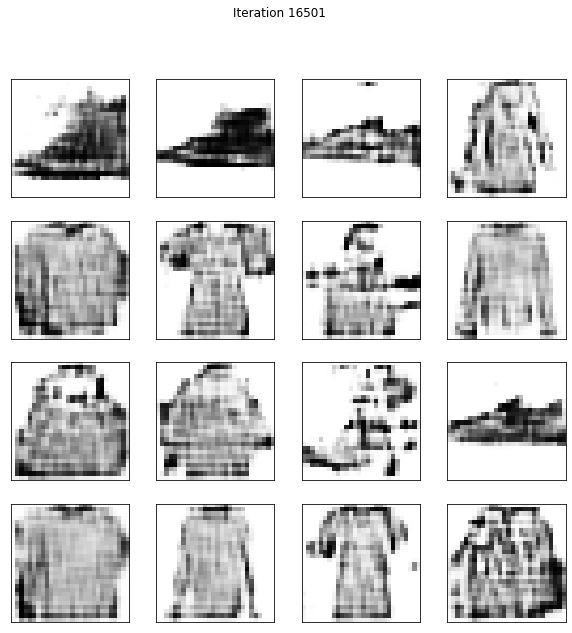

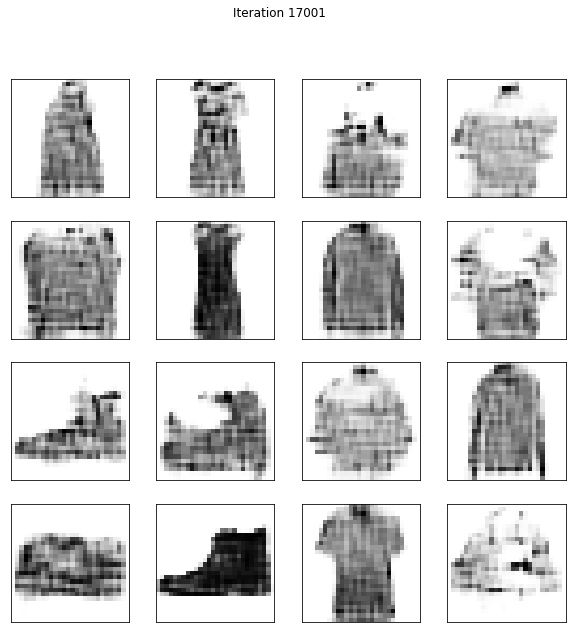

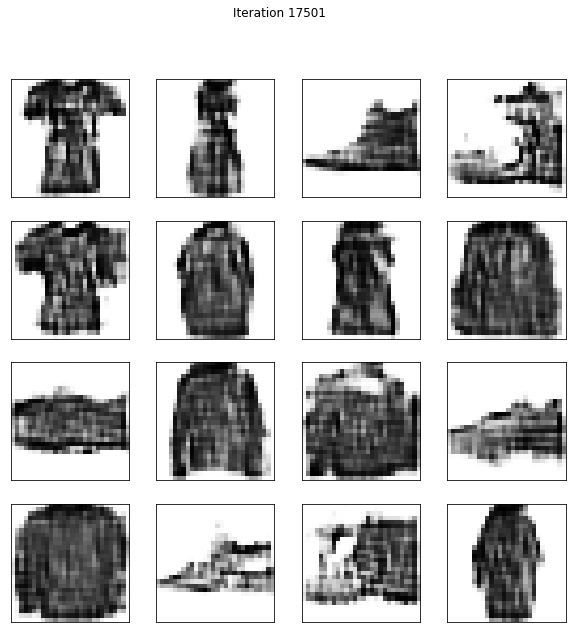

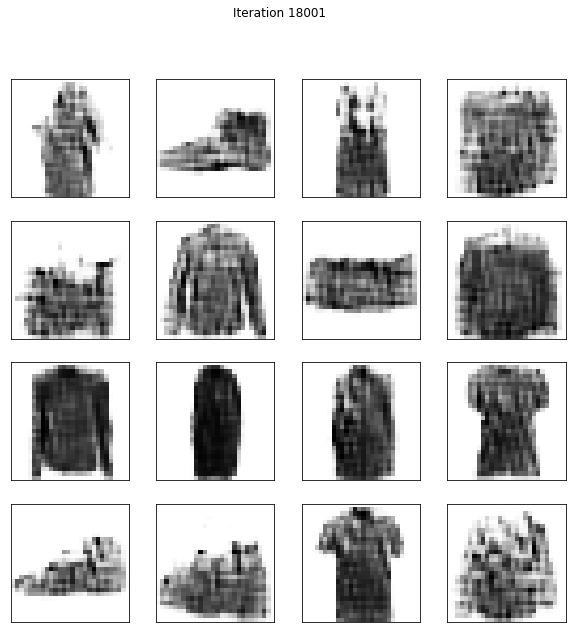

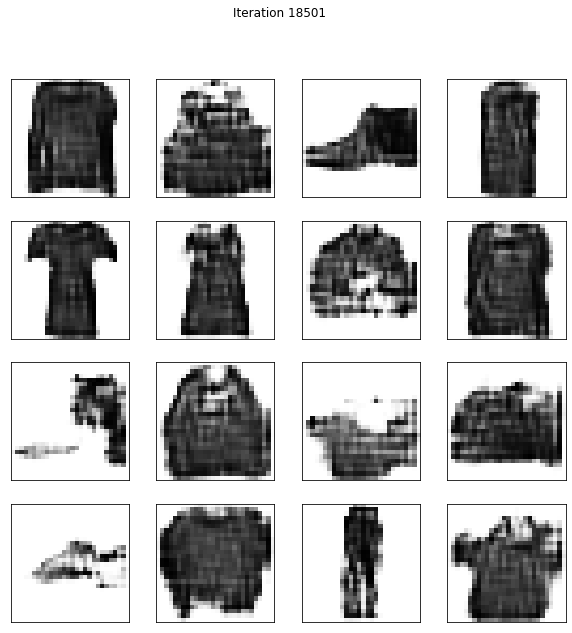

In [22]:
# Train the GAN
losses = {"d":[], "g":[]}
discriminator_acc = []
batch_size = 64
nsamples = len(train_images)
iterations_per_epoch = nsamples / batch_size   # number of training steps per epoch len(train_images)
epochs = 20

iters = 0

for epoch in range(epochs):
    print("Epoch: {0:2d}/{1:2d}".format(epoch, epochs))
    perm = np.random.choice(nsamples, size=nsamples, replace='False')

    for i in range(int(iterations_per_epoch)):
        
        # Create a mini-batch of data (X: real images + fake images, y: corresponding class vectors)
        image_batch = train_images[perm[i*batch_size:(i+1)*batch_size],:,:,:]    # real images   
        noise_gen = np.random.uniform(0.,1.,size=[batch_size, latent_size])
        
        # generate images using the generator
        generated_images = g.predict(noise_gen)

        X = np.concatenate((image_batch, generated_images))
        y = np.zeros([2*batch_size,2])  # class vector
        y[0:batch_size,1] = 1
        y[batch_size:,0] = 1
    
        # Train the discriminator on the mini-batch
        d_loss, d_acc  = d.train_on_batch(X,y)
        losses["d"].append(d_loss)
        discriminator_acc.append(d_acc)
    
        # Create a new mini-batch of data (X_: noise, y_: class vectors pretending that these produce real images)
        X_ = np.random.uniform(0.,1.,size=[batch_size, latent_size])
        y_ = np.zeros([batch_size,2])
        y_[:,1] = 1
    
        # Train the generator part of the GAN on the mini-batch
        g_loss = generator_training.train_on_batch(X_, y_)
        losses["g"].append(g_loss)

        iters +=1

        if iters % 500 == 1: 
          # Plot some fake images
          print("iteration", iters)
          print("generator loss", losses["g"][-1])
          print("discriminator loss", losses["d"][-1])
      
          noise = np.random.uniform(0.,1.,size=[16,latent_size])
          generated_images = g.predict(noise)
          plt.figure(figsize=(10,10))
          
          for i in range(16):
              plt.subplot(4,4,i+1)
              plt.xticks([])
              plt.yticks([])
              plt.grid(False)
              img = plt.imshow((255 * generated_images[i]).astype(np.int).squeeze(), cmap=plt.cm.binary)
      
          plt.suptitle("Iteration %i" %iters)
          plt.savefig("./fake_fMNIST_iteration_%.6i.png" % iters)

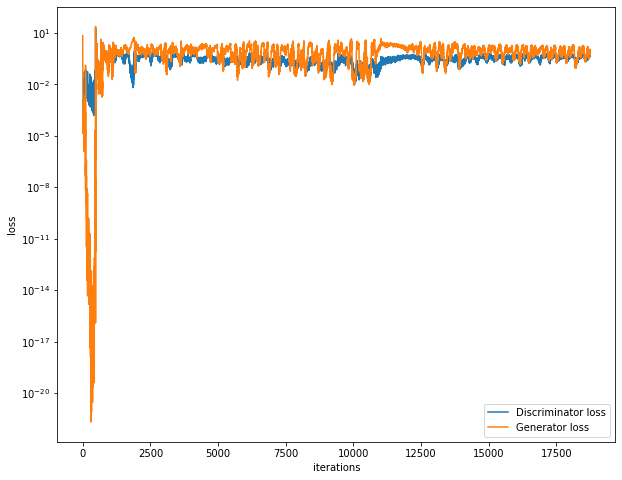

In [23]:
# Plot the loss for the generator and discriminator
plt.figure(figsize=(10,8))
plt.semilogy(losses["d"], label='Discriminator loss')
plt.semilogy(losses["g"], label='Generator loss')
plt.ylabel("loss")
plt.xlabel("iterations")
plt.legend()
plt.show()


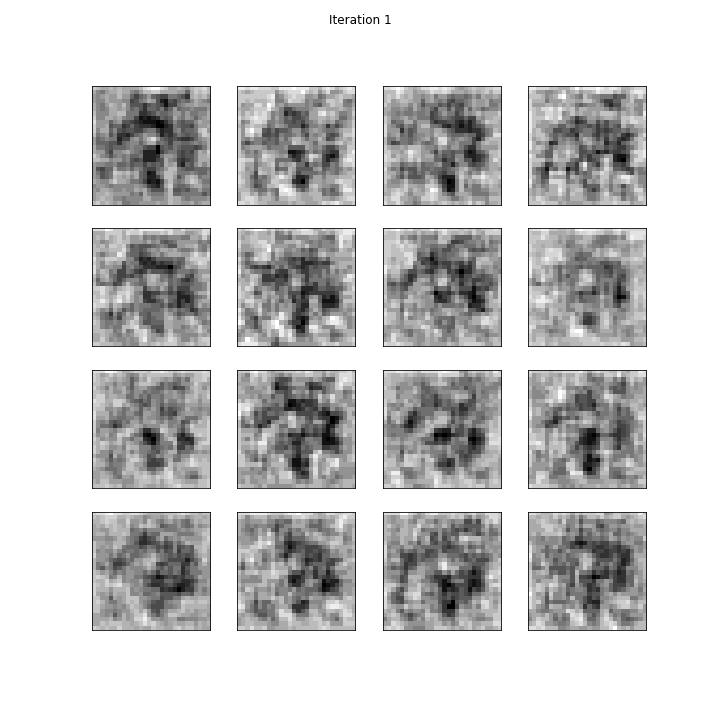

In [24]:
# Create a GIF of the training process
import imageio
import glob

out_file = 'generated_fMNIST_samples.gif'

with imageio.get_writer(out_file, mode='I', duration=0.5) as writer:
    file_names = glob.glob('fake_fMNIST_iteration*.png')
    file_names = sorted(file_names)
    last = -1

    for i, file_name in enumerate(file_names):
        animated_image = imageio.imread(file_name)
        writer.append_data(animated_image)

    animated_image = imageio.imread(file_name)
    writer.append_data(animated_image)

from IPython.display import Image
Image(open('generated_fMNIST_samples.gif','rb').read())